In [1]:
import pandas as pd
import numpy as np
import scipy
import scipy.stats as stats
import sklearn
from sklearn.neighbors import DistanceMetric
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.mode.chained_assignment = None 
from scipy.spatial.distance import pdist, squareform
pd.set_option('display.max_rows', None)
import random
import copy

In [2]:
def deleteindex(indexi, dataframe):
    for it in indexi:
        #print(it)
        dataframe = dataframe.drop(dataframe.index[it])   
    return dataframe

In [3]:
def upper_tri_indexing(A):
    m = A.shape[0]
    r,c = np.triu_indices(m,1)
    return A[r,c]

# Loading data

In [4]:
mood = pd.read_csv("cleaned_mood.csv")
phone_use_cat_cleaned = pd.read_csv("cleaned_phoneuse_categories.csv")
categories = pd.read_csv("app_categories.csv")

# Modeling

In [5]:
#there are 11 moods and 18 app categories
mood_list= ['anxious',
       'bored', 'gloomy', 'calm', 'stressed', 'content', 'cheerful', 'tired',
       'energetic', 'upset', 'envious']
neg_mood_list = ['anxious',
       'bored', 'gloomy', 'stressed', 'tired',
        'upset', 'envious']
pos_mood_list = ['calm', 'content', 'cheerful',
       'energetic']
categories_list=['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']

# Matrices mood

In [6]:
#only moods and user id are useful and therefore selected
column_names=["user_id"]+ mood_list 
combination_users = mood.loc[:, column_names]
combination_users

,user_id,anxious,bored,gloomy,calm,stressed,content,cheerful,tired,energetic,upset,envious
0,10161,3.0,2.0,3.0,4.0,1.0,3.0,4.0,2.0,3.0,4.0,3.0
1,10161,3.0,3.0,4.0,2.0,3.0,4.0,1.0,3.0,4.0,2.0,3.0
2,10161,3.0,2.0,3.0,3.0,2.0,3.0,4.0,2.0,3.0,4.0,3.0
3,10161,3.0,4.0,3.0,2.0,2.0,3.0,2.0,3.0,3.0,4.0,2.0
4,10161,3.0,2.0,3.0,3.0,2.0,3.0,2.0,3.0,2.0,3.0,2.0
5,10176,1.0,0.0,0.0,4.0,3.0,4.0,3.0,4.0,1.0,1.0,0.0
6,10176,2.0,1.0,1.0,4.0,2.0,4.0,4.0,2.0,3.0,2.0,1.0
7,10176,0.0,0.0,2.0,3.0,3.0,3.0,4.0,2.0,1.0,2.0,0.0
8,10176,0.0,1.0,1.0,5.0,1.0,3.0,3.0,2.0,2.0,1.0,0.0
9,10176,0.0,0.0,0.0,5.0,0.0,3.0,3.0,1.0,1.0,0.0,0.0


# Matrix all moods by median 

In [7]:
#create the dataframe with median moods so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the moods combination can be summed over all the registrations of one user and add this as one row to a new dataframe
matrix_mood_median = pd.DataFrame()
median_col = 0
participants = np.unique(combination_users.user_id)
for userid in participants:
    #print(userid)
    mood_rows_per_participant = combination_users[combination_users["user_id"] == userid]
    #print( mood_rows_per_participant)
    #the median is used as center size for the mood values summary per participant (try other center sizes as well!)
    median_col = mood_rows_per_participant.median()
    median_col[0] = int(userid) #proberen er geen float value van te maken
    #print(median_col)
    matrix_mood_median = matrix_mood_median.append(median_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_mood_median.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_allmood_median = matrix_mood_median.reindex(columns= col_names)

In [8]:
matrix_allmood = matrix_allmood_median.set_index("user_id")
matrix_allmood

,anxious,bored,calm,cheerful,content,energetic,envious,gloomy,stressed,tired,upset
user_id,,,,,,,,,,,
10161.0,3.0,3.0,3.0,2.5,3.0,3.0,3.0,2.0,2.0,3.0,2.0
10176.0,0.0,1.0,4.0,3.0,3.0,2.5,0.0,1.0,1.0,1.0,1.0
10177.0,0.0,0.0,4.0,3.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0
10178.0,0.0,0.0,3.0,3.0,3.0,3.0,0.0,0.0,2.0,1.0,0.0
10179.0,2.0,1.0,2.0,0.0,1.0,1.0,0.0,4.0,3.0,5.0,2.0
10180.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0
10181.0,0.0,0.0,4.0,1.0,3.0,0.0,0.0,0.0,2.0,1.0,1.0
10182.0,0.0,0.0,3.0,2.0,2.0,2.0,0.0,0.0,0.0,3.0,0.0
10183.0,0.0,1.0,4.0,3.0,4.0,2.0,0.0,1.0,1.0,1.0,0.0


# Create matrix with pearson correlation distance 

In [9]:
RDM_mood_correlation_distance = pd.DataFrame(
    squareform(pdist(matrix_allmood, metric='correlation')),
    columns = matrix_allmood.index,
    index = matrix_allmood.index
)
RDM_mood_correlation_distance_fill = RDM_mood_correlation_distance.fillna(0)
RDM_mood_correlation_distance_fill

user_id,10161.0,10176.0,10177.0,10178.0,10179.0,10180.0,10181.0,10182.0,10183.0,10184.0,...,10599.0,10600.0,10601.0,10604.0,10605.0,10606.0,10608.0,10609.0,10865.0,10947.0
user_id,,,,,,,,,,,,,,,,,,,,,
10161.0,0.000000,0.824846,0.656895,0.807894,1.317783,0.978946,0.949939,0.531110,0.726022,0.528434,...,0.820132,1.343105,1.410668,0.612229,6.686355e-01,6.686355e-01,1.155799,0.787038,1.407040,0.737336
10176.0,0.824846,0.000000,0.050895,0.120345,1.235740,0.550106,0.288504,0.247602,0.047090,0.135030,...,0.130067,1.538793,1.719301,0.081914,7.819222e-02,7.819222e-02,0.360230,0.233256,0.719738,0.303328
10177.0,0.656895,0.050895,0.000000,0.107260,1.412320,0.543414,0.395529,0.268261,0.085900,0.107715,...,0.115963,1.638158,1.815568,0.033397,1.366241e-02,1.366241e-02,0.407997,0.289474,0.898537,0.429675
10178.0,0.807894,0.120345,0.107260,0.000000,1.249151,0.388984,0.358895,0.268388,0.129144,0.277703,...,0.019599,1.389143,1.643208,0.085901,9.489438e-02,9.489438e-02,0.240827,0.359059,0.665073,0.475670
10179.0,1.317783,1.235740,1.412320,1.249151,0.000000,0.901347,0.949734,0.898118,1.229248,1.575427,...,1.316056,0.397111,0.450204,1.336771,1.456673e+00,1.456673e+00,0.782004,0.993070,0.556063,0.655675
10180.0,0.978946,0.550106,0.543414,0.388984,0.901347,0.000000,0.646163,0.461184,0.483602,0.701876,...,0.414373,1.327805,1.232210,0.483975,5.370900e-01,5.370900e-01,0.486108,0.672195,1.083333,0.777217
10181.0,0.949939,0.288504,0.395529,0.358895,0.949734,0.646163,0.000000,0.445836,0.254501,0.436424,...,0.379814,1.254514,1.078878,0.465156,4.758576e-01,4.758576e-01,0.354127,0.395529,0.679188,0.192793
10182.0,0.531110,0.247602,0.268261,0.268388,0.898118,0.461184,0.445836,0.000000,0.262655,0.404026,...,0.298789,1.269145,1.583887,0.173002,2.933007e-01,2.933007e-01,0.452367,0.360780,0.880263,0.244198
10183.0,0.726022,0.047090,0.085900,0.129144,1.229248,0.483602,0.254501,0.262655,0.000000,0.124491,...,0.110540,1.515088,1.647529,0.102188,1.035785e-01,1.035785e-01,0.325954,0.245505,0.759014,0.294392


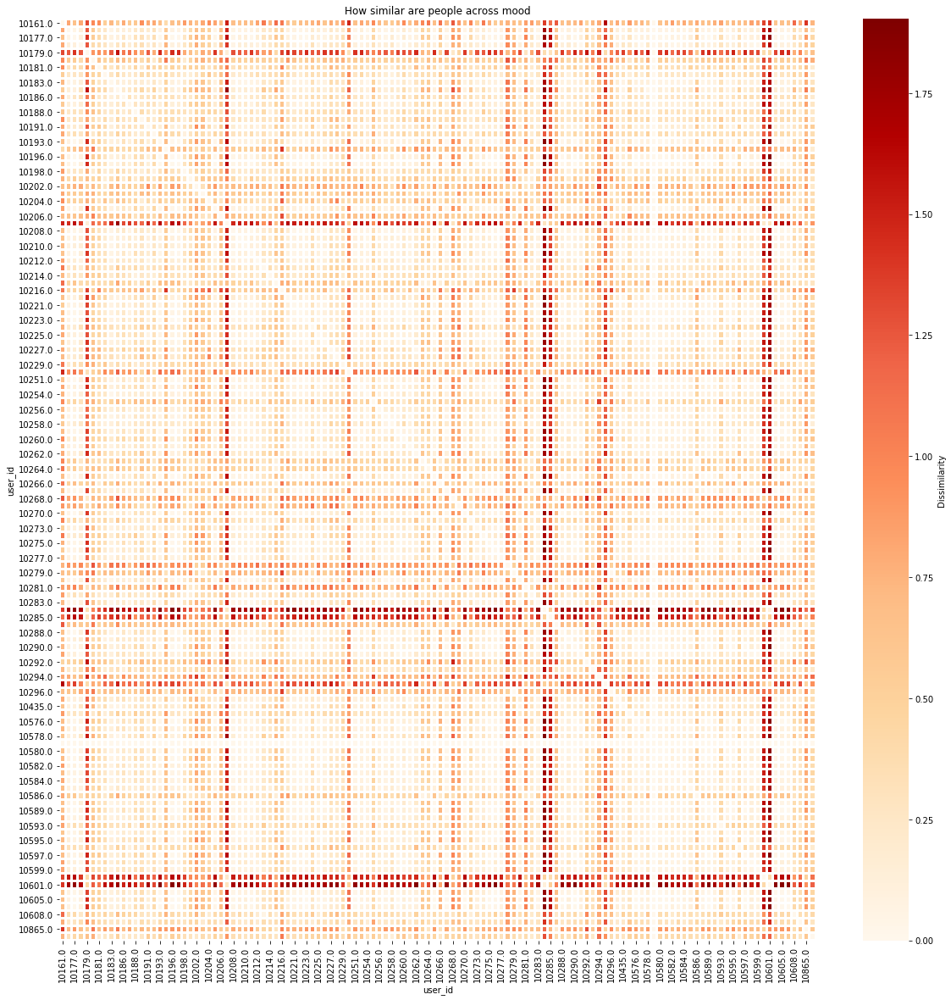

In [10]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_mood_correlation_distance_fill,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across mood")
plt.show()

# Matrix negative moods by median 

In [11]:
#only negative moods and user id are useful and therefore selected
column_names=["user_id"]+ neg_mood_list 
combination_users_neg = mood.loc[:, column_names]
combination_users_neg

,user_id,anxious,bored,gloomy,stressed,tired,upset,envious
0,10161,3.0,2.0,3.0,1.0,2.0,4.0,3.0
1,10161,3.0,3.0,4.0,3.0,3.0,2.0,3.0
2,10161,3.0,2.0,3.0,2.0,2.0,4.0,3.0
3,10161,3.0,4.0,3.0,2.0,3.0,4.0,2.0
4,10161,3.0,2.0,3.0,2.0,3.0,3.0,2.0
5,10176,1.0,0.0,0.0,3.0,4.0,1.0,0.0
6,10176,2.0,1.0,1.0,2.0,2.0,2.0,1.0
7,10176,0.0,0.0,2.0,3.0,2.0,2.0,0.0
8,10176,0.0,1.0,1.0,1.0,2.0,1.0,0.0
9,10176,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [12]:
#create the dataframe with mean negative moods so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the moods combination can be summed over all the registrations of one user and add this as one row to a new dataframe
matrix_neg_mood = pd.DataFrame()
median_col = 0
participants = np.unique(combination_users_neg.user_id)
for userid in participants:
    #print(userid)
    mood_rows_per_participant = combination_users_neg[combination_users_neg["user_id"] == userid]
    #the median is used as center size for the mood values summary per participant (try other center sizes as well!)
    median_col = mood_rows_per_participant.median()
    median_col[0] = int(userid) #proberen er geen float value van te maken
    #print(mean_col)
    matrix_neg_mood = matrix_neg_mood.append(median_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_neg_mood.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_neg_mood = matrix_neg_mood.reindex(columns= col_names)

In [13]:

matrix_negmood = matrix_neg_mood.set_index("user_id")
matrix_negmood

,anxious,bored,envious,gloomy,stressed,tired,upset
user_id,,,,,,,
10161.0,3.0,3.0,3.0,2.0,2.0,3.0,2.0
10176.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
10177.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10178.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0
10179.0,2.0,1.0,0.0,4.0,3.0,5.0,2.0
10180.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0
10181.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0
10182.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
10183.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0


# Create matrix with pearson correlation distance

In [14]:
RDM_neg_corr_dist = pd.DataFrame(
    squareform(pdist(matrix_negmood, metric='correlation')),
    columns = matrix_negmood.index,
    index = matrix_negmood.index
)
RDM_neg_corr_dist_fill = RDM_neg_corr_dist.fillna(0)
RDM_neg_corr_dist_fill

user_id,10161.0,10176.0,10177.0,10178.0,10179.0,10180.0,10181.0,10182.0,10183.0,10184.0,...,10599.0,10600.0,10601.0,10604.0,10605.0,10606.0,10608.0,10609.0,10865.0,10947.0
user_id,,,,,,,,,,,,,,,,,,,,,
10161.0,0.000000,1.547723,0.0,1.283069,1.311086,1.166667,1.509525,6.464466e-01,1.166667,0.490475,...,1.283069,1.058926,1.544581,6.464466e-01,0.0,0.0,1.471405,0.908713,1.495074,1.000000
10176.0,1.547723,0.000000,0.0,0.627896,0.432038,0.908713,0.503861,7.418011e-01,0.269703,1.062017,...,0.627896,0.741801,0.891535,7.418011e-01,0.0,0.0,0.741801,0.700000,0.349209,0.408392
10177.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.000000,0.000000,0.000000,0.000000
10178.0,1.283069,0.627896,0.0,0.000000,0.542095,0.490475,0.115385,6.797437e-01,0.490475,1.346154,...,0.000000,0.399519,0.159159,6.797437e-01,0.0,0.0,0.306111,0.627896,0.428228,0.633100
10179.0,1.311086,0.432038,0.0,0.542095,0.000000,0.585219,0.594930,3.400880e-01,0.403753,1.651635,...,0.542095,0.340088,0.722782,3.400880e-01,0.0,0.0,0.254544,0.432038,0.414761,0.159973
10180.0,1.166667,0.908713,0.0,0.490475,0.585219,0.000000,0.716931,6.464466e-01,0.583333,1.283069,...,0.490475,1.058926,0.504926,6.464466e-01,0.0,0.0,0.646447,0.908713,1.148522,1.000000
10181.0,1.509525,0.503861,0.0,0.115385,0.594930,0.716931,0.000000,7.598078e-01,0.716931,1.461538,...,0.115385,0.479584,0.192793,7.598078e-01,0.0,0.0,0.386175,0.937983,0.394594,0.633100
10182.0,0.646447,0.741801,0.0,0.679744,0.340088,0.646447,0.759808,0.000000e+00,0.646447,1.240192,...,0.679744,0.583333,1.070014,2.220446e-16,0.0,0.0,0.777778,0.741801,0.929986,0.236237
10183.0,1.166667,0.269703,0.0,0.490475,0.403753,0.583333,0.716931,6.464466e-01,0.000000,0.886772,...,0.490475,0.646447,0.851478,6.464466e-01,0.0,0.0,0.646447,0.269703,0.455419,0.459938


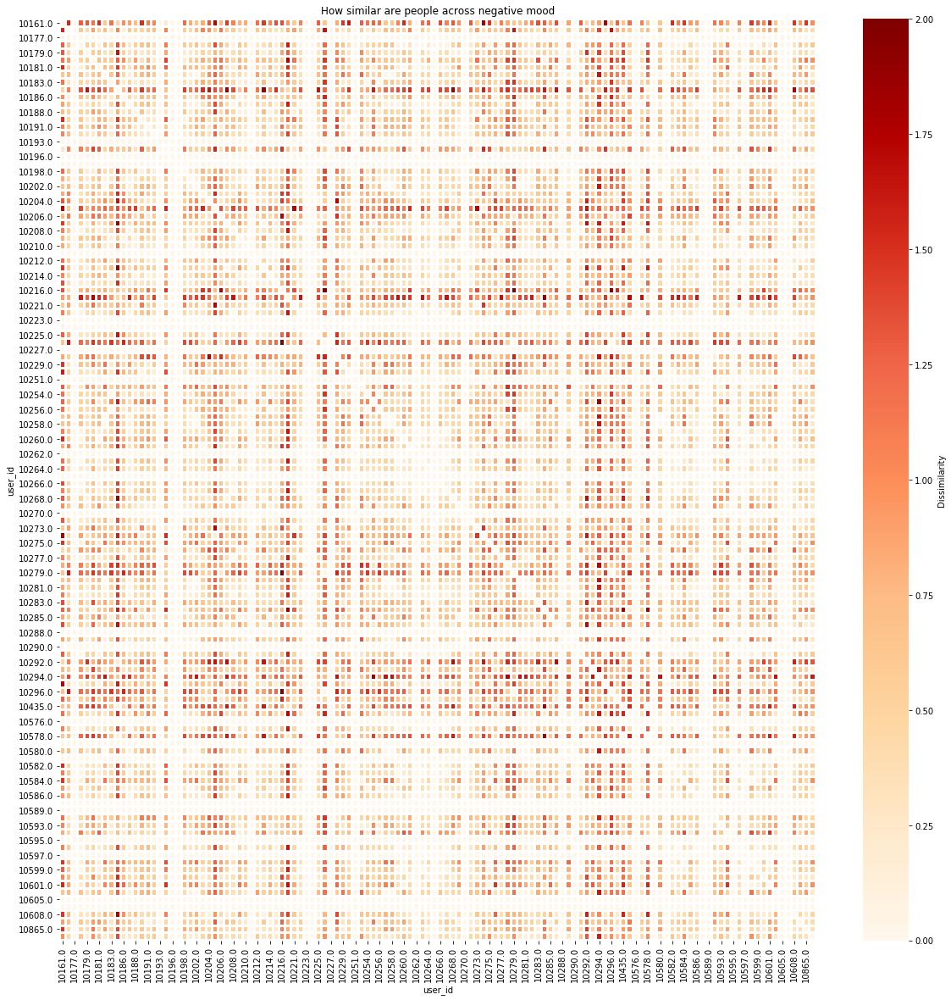

In [15]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_neg_corr_dist_fill,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across negative mood")
plt.show()

# Matrix positive moods by median

In [16]:
#only negative moods and user id are useful and therefore selected
column_names=["user_id"]+ pos_mood_list 
combination_users_pos = mood.loc[:, column_names]


In [17]:
#create the dataframe with mean negative moods so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the moods combination can be summed over all the registrations of one user and add this as one row to a new dataframe
matrix_pos_mood = pd.DataFrame()
median_col = 0
participants = np.unique(combination_users_pos.user_id)
for userid in participants:
    #print(userid)
    mood_rows_per_participant = combination_users_pos[combination_users_pos["user_id"] == userid]
    #the median is used as center size for the mood values summary per participant (try other center sizes as well!)
    median_col = mood_rows_per_participant.median()
    median_col[0] = int(userid) #proberen er geen float value van te maken
    #print(mean_col)
    matrix_pos_mood = matrix_pos_mood.append(median_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_pos_mood.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_pos_mood= matrix_pos_mood.reindex(columns= col_names)

In [18]:
matrix_posmood = matrix_pos_mood.set_index("user_id")
matrix_posmood

,calm,cheerful,content,energetic
user_id,,,,
10161.0,3.0,2.5,3.0,3.0
10176.0,4.0,3.0,3.0,2.5
10177.0,4.0,3.0,3.0,3.0
10178.0,3.0,3.0,3.0,3.0
10179.0,2.0,0.0,1.0,1.0
10180.0,2.0,2.0,2.0,2.0
10181.0,4.0,1.0,3.0,0.0
10182.0,3.0,2.0,2.0,2.0
10183.0,4.0,3.0,4.0,2.0


In [19]:
RDM_pos_corr_dist = pd.DataFrame(
    squareform(pdist(matrix_posmood, metric='correlation')),
    columns = matrix_posmood.index,
    index = matrix_posmood.index
)
RDM_pos_corr_dist_fill = RDM_pos_corr_dist.fillna(0)
RDM_pos_corr_dist_fill

user_id,10161.0,10176.0,10177.0,10178.0,10179.0,10180.0,10181.0,10182.0,10183.0,10184.0,...,10599.0,10600.0,10601.0,10604.0,10605.0,10606.0,10608.0,10609.0,10865.0,10947.0
user_id,,,,,,,,,,,,,,,,,,,,,
10161.0,0.000000,8.675468e-01,0.666667,0.0,0.183503,0.0,0.634852,0.666667,0.825922,1.000000e+00,...,1.577350,2.000000,0.422650,0.0,0.0,0.0,1.333333,1.174078,0.0,0.477767
10176.0,0.867547,0.000000e+00,0.072827,0.0,0.351114,0.0,0.129428,0.072827,0.239114,2.667147e-02,...,1.229416,1.132453,0.311753,0.0,0.0,0.0,0.337734,0.100771,0.0,0.100771
10177.0,0.666667,7.282735e-02,0.000000,0.0,0.183503,0.0,0.269703,0.000000,0.477767,1.835034e-01,...,1.577350,1.333333,0.422650,0.0,0.0,0.0,0.666667,0.129612,0.0,0.129612
10178.0,0.000000,0.000000e+00,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
10179.0,0.183503,3.511143e-01,0.183503,0.0,0.000000,0.0,0.329180,0.183503,0.573599,5.000000e-01,...,1.707107,1.816497,0.292893,0.0,0.0,0.0,1.000000,0.573599,0.0,0.147197
10180.0,0.000000,0.000000e+00,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
10181.0,0.634852,1.294285e-01,0.269703,0.0,0.329180,0.0,0.000000,0.269703,0.046537,1.055728e-01,...,1.000000,1.365148,0.051317,0.0,0.0,0.0,0.269703,0.427922,0.0,0.046537
10182.0,0.666667,7.282735e-02,0.000000,0.0,0.183503,0.0,0.269703,0.000000,0.477767,1.835034e-01,...,1.577350,1.333333,0.422650,0.0,0.0,0.0,0.666667,0.129612,0.0,0.129612
10183.0,0.825922,2.391141e-01,0.477767,0.0,0.573599,0.0,0.046537,0.477767,0.000000,1.471971e-01,...,0.698489,1.174078,0.095466,0.0,0.0,0.0,0.129612,0.545455,0.0,0.181818


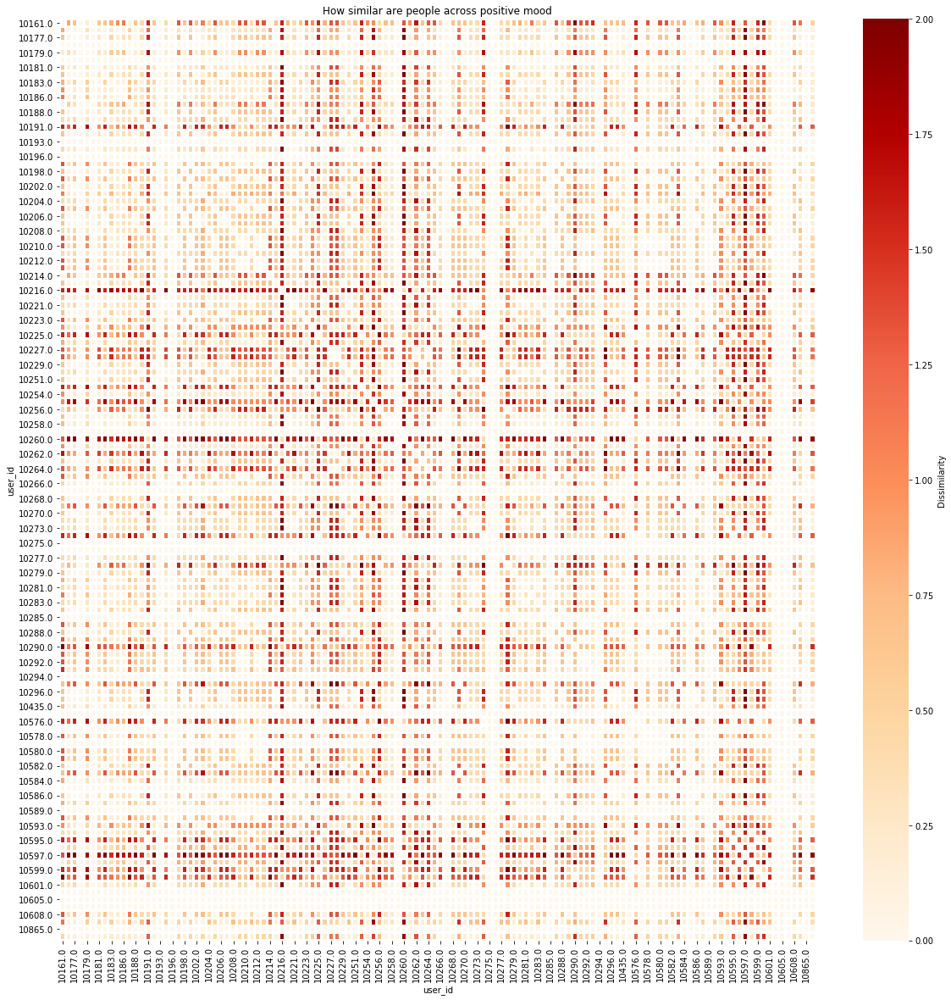

<Figure size 432x288 with 0 Axes>

In [20]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_pos_corr_dist_fill,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across positive mood")
plt.show()
plt.savefig("RDM_pos.png")

# Matrices phone use categories

In [21]:
#all the new categories are added to the phone use dataset with value zero. 
phoneuse_categories_frame = phone_use_cat_cleaned
new_cats = (np.unique(phoneuse_categories_frame["new_category"]))
for item in new_cats:
    phoneuse_categories_frame[item] = 0.0

In [22]:
part_phoneuse = phoneuse_categories_frame[2000:4000]

# Matrix duration by total

In [23]:
#use the duration of the app category per registration as value
#phoneuse_categories_duration = phoneuse_categories_frame
#count = 0
#for row in range(0,(phoneuse_categories_duration.shape[0])):
    #print(row)
#    if count % 1000 == 0:
#        print('did 1000, still running', count)
#        print("I'm at phone registration ", row)
#        print("I still have to run ... loops", phoneuse_categories_duration.shape[0]-row)
#    rown = phoneuse_categories_duration.iloc[row]
#    cat = rown.loc["new_category"]
    #print(rown.loc["new_category"])
#    phoneuse_categories_duration.ix[row,cat] = phoneuse_categories_duration.ix[row, "duration_app"]
#    count += 1
#phoneuse_categories_duration.to_csv("frame_duration_categories.csv")

#load the frequency frame 
phoneuse_duration_frame = pd.read_csv("frame_duration_categories.csv")

In [24]:
phoneuse_duration_frame.shape

(457182, 27)

In [25]:
#check for youtube cat if it worked
print(phoneuse_duration_frame["Youtube"].sum())

youtube_rows = phone_use_cat_cleaned.loc[phone_use_cat_cleaned["new_category"] == "Youtube"]
youtube_rows["duration_app"].sum()

6056913.848


6056913.847999999

In [26]:
#only categories and user id are useful and therefore selected
column_names_cat=["user_id"]+ categories_list 
combination_users_cat = phoneuse_duration_frame.loc[:, column_names_cat]
combination_users_cat.max()

user_id               10947.000
Background_Process     1461.838
Communication         11914.495
Entertainment         19200.409
Facebook               6446.697
Facebook_Messenger     8332.600
Finance                 716.528
Games                  8735.384
Google_Chrome          8663.453
Instagram             13683.100
Lifestyle              6589.129
Online_Shopping        1331.978
Productivity          10798.301
Snapchat               6939.074
Social                 2795.902
Spotify                5992.570
Utility                4063.390
Whatsapp_Messenger    20150.524
Youtube               22505.684
dtype: float64

In [27]:
#create the dataframe with total duration of app use so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the phone use duration per category can be summed over all the registrations of one user and add this as one row to a new dataframe
combination_users_cat_duration = combination_users_cat
matrix_duration = pd.DataFrame()
mean_col = 0
participants = np.unique(combination_users_cat.user_id)
for userid in participants:
    #print(userid)
    phone_rows_per_participant = combination_users_cat[combination_users_cat["user_id"] == userid]
    #print(phone_rows_per_participant)
    #the total is used as (center) size for the duration values per category summary per participant (try other center sizes as well!)
    total_col = (np.sum(phone_rows_per_participant)) #stays in SECONDS!!!!!!!!
    total_col[0] = int(userid) #proberen er geen float value van te maken
    #print(total_col)
    matrix_duration = matrix_duration.append(total_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_duration.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_duration_total = matrix_duration.reindex(columns= col_names)

In [28]:
matrix_duration_total[0:10]

,user_id,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube
0,10161.0,429.284,10548.315,20049.605,0.000,69651.385,0.000,0.000,17578.079,0.000,6321.480,2081.587,1788.704,0.000,0.000,0.000,19017.145,63134.379,317134.122
1,10176.0,511.805,13729.147,1313.996,14151.576,17.310,278.934,55.674,29012.376,89187.420,71549.740,0.000,495.745,36250.870,0.000,705.546,1123.883,19549.641,4555.256
2,10177.0,779.893,296.205,4036.272,0.000,5415.628,117.127,0.000,0.000,0.000,121.267,0.000,799.516,0.000,0.000,0.000,2080.768,1452.755,0.000
3,10178.0,294.859,8022.245,19224.298,2895.144,81.928,863.832,27.068,7245.845,39705.159,873.229,1852.835,5041.845,2637.500,0.000,4024.030,4972.154,20541.239,7.755
4,10179.0,622.895,34621.551,78589.748,34740.164,131.681,116.742,109608.913,0.000,43544.056,29438.796,0.000,13299.452,6597.278,0.000,97845.152,3929.925,74594.721,3391.983
5,10180.0,1480.439,13812.818,6950.841,54329.617,9062.239,797.435,23.343,47777.499,159236.438,8346.220,0.000,939.555,2526.911,0.000,0.000,16282.757,501143.158,71345.574
6,10181.0,58.960,2114.718,1633.450,5563.531,1096.209,13.815,0.000,6465.733,17684.523,1045.947,0.000,1266.612,4379.310,0.000,483.285,490.705,17296.420,105.732
7,10182.0,1052.696,1208.308,814.236,0.000,0.000,333.889,23237.123,11648.666,0.000,51709.368,0.000,228.820,908.502,0.000,6818.395,1781.746,10588.581,15564.730
8,10183.0,404.376,51678.012,8477.267,184246.722,425.625,1345.898,20047.852,0.000,69710.593,12811.878,7342.529,2242.965,395.343,27140.689,3374.015,2787.700,33946.315,3789.543
9,10184.0,669.288,4693.073,2843.382,73437.465,94.402,608.532,52931.892,12298.631,163087.261,48809.889,0.000,12897.803,23028.441,1647.378,3234.347,3575.573,39443.019,6734.757


In [29]:
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
matrix_duration_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(matrix_duration_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_duration_cats_total = pd.DataFrame(eucl_dist.pairwise(matrix_duration_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = matrix_duration_total.user_id.unique(), index = matrix_duration_total.user_id.unique())

In [30]:
RDM_duration_cats_total

,10161.0,10176.0,10177.0,10178.0,10179.0,10180.0,10181.0,10182.0,10183.0,10184.0,...,10599.0,10600.0,10601.0,10604.0,10605.0,10606.0,10608.0,10609.0,10865.0,10947.0
10161.0,0.000000,344958.314425,330917.149235,330429.131580,365167.232608,534192.561368,329515.713675,319375.223045,382433.321016,373648.358627,...,230437.216232,325604.411198,327063.818175,239213.762846,296533.663515,332525.538221,332490.750938,181087.221938,332356.832467,331071.206032
10176.0,344958.314425,0.000000,126409.589547,97976.209002,192485.884905,498742.226421,108828.812275,105037.904829,194404.046810,115744.272214,...,173420.687636,123024.439512,113966.265673,264401.174579,167601.770817,125920.638064,126484.338281,240311.634009,126075.063028,117296.150402
10177.0,330917.149235,126409.589547,0.000000,48732.627061,194625.559465,534651.780446,26226.238922,61246.277295,209596.274419,198857.154856,...,152003.620793,22041.672809,52475.671496,285791.213718,144067.229322,7147.695013,6469.435058,227324.761515,7518.495234,16832.743910
10178.0,330429.131580,97976.209002,48732.627061,0.000000,173095.311990,505103.753963,30044.792955,74176.530695,193352.218942,162757.848279,...,146913.914027,51980.370385,41134.098760,260975.722724,131407.669874,50158.941737,50032.728256,221258.917977,49926.086999,39108.752902
10179.0,365167.232608,192485.884905,194625.559465,173095.311990,0.000000,480216.626128,185194.639271,176349.353534,219254.772873,191393.090196,...,213744.716291,193992.052076,177843.596298,273334.463618,192977.374558,196411.960493,196120.707997,268461.902786,195942.121167,188945.662866
10180.0,534192.561368,498742.226421,534651.780446,505103.753963,480216.626128,0.000000,513655.708226,525667.888152,502927.506158,473641.219053,...,508354.838245,532246.758164,483485.479758,523036.093220,516124.907518,535696.280949,536012.494292,513338.280156,535220.403404,523141.015731
10181.0,329515.713675,108828.812275,26226.238922,30044.792955,185194.639271,513655.708226,0.000000,61806.052380,197063.523406,178642.547993,...,148423.106375,28319.674462,33472.797406,278335.725241,140763.306347,26174.678383,26580.140512,223699.667653,25945.959366,13154.034613
10182.0,319375.223045,105037.904829,61246.277295,74176.530695,176349.353534,525667.888152,61806.052380,0.000000,211103.770579,185679.121025,...,147724.252237,60303.779139,72687.091287,280123.165816,142253.452340,60758.941346,61179.572809,214847.358431,61112.872766,61420.705753
10183.0,382433.321016,194404.046810,209596.274419,193352.218942,219254.772873,502927.506158,197063.523406,211103.770579,0.000000,164728.710754,...,251598.064301,194723.500064,199100.657608,320641.220088,246017.183662,209775.215536,209863.540920,300788.018167,208738.785857,198812.064420
10184.0,373648.358627,115744.272214,198857.154856,162757.848279,191393.090196,473641.219053,178642.547993,185679.121025,164728.710754,0.000000,...,234032.812950,192560.490425,177814.497825,270507.786550,229421.583351,198675.733439,199121.194419,287491.336154,198766.469973,186116.301821


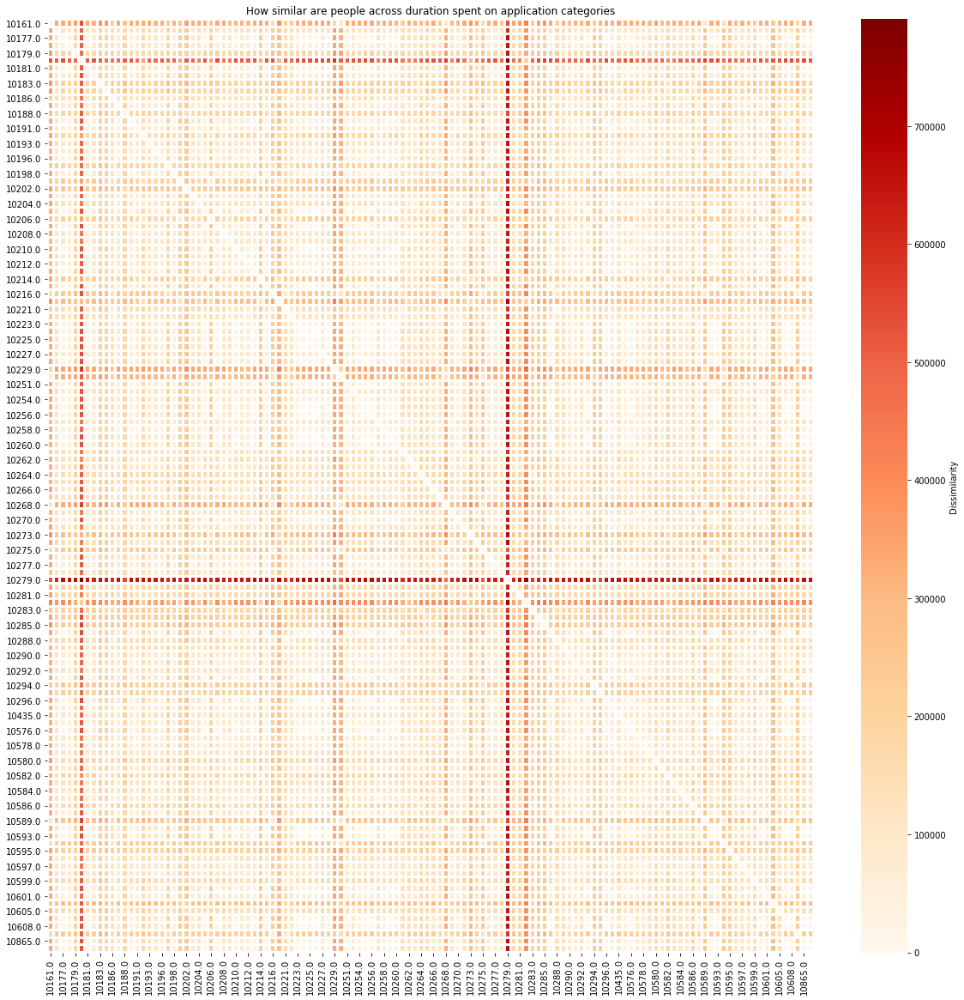

In [31]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_duration_cats_total,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across duration spent on application categories")
plt.show()

# Matrix frequency by total

In [32]:
#use the frequency of the app category per registration as value
#phone_use_categories_freq = phoneuse_categories_frame
#count = 0
#for row in range(0,(phone_use_categories_freq.shape[0])):
    #print(row)
#    if count % 1000 == 0:
#        print('did 1000, still running', count)
#        print("I'm at phone registration ", row)
#        print("I still have to run ... loops", phone_use_categories_freq.shape[0]-row)
#    rown = phone_use_categories_freq.iloc[row]
#    cat = rown.loc["new_category"]
#    #print(rown.loc["better_category_hybrid"])
#    phone_use_categories_freq.ix[row,cat] = phone_use_categories_freq.ix[row, "frequency_app"]
#    count += 1
    
#phone_use_categories_freq.to_csv("frame_frequency_categories.csv")

#load the frequency frame 
phoneuse_frequency_frame = pd.read_csv("frame_frequency_categories.csv")


In [33]:
#check for youtube cat if it worked
print(phoneuse_frequency_frame["Youtube"].sum())

youtube_rows = phone_use_cat_cleaned.loc[phone_use_cat_cleaned["new_category"] == "Youtube"]
print(youtube_rows["frequency_app"].sum())

15789.0
15789.0


In [34]:
#only categories and user id are useful and therefore selected
column_names_cat=["user_id"]+ categories_list 
combination_users_cat_fr = phoneuse_frequency_frame.loc[:, column_names_cat]
combination_users_cat_fr[0:20]

,user_id,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube
0,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,10224,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
#create the dataframe with total freq of app use so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the phone use freq per category can be summed over all the registrations of one user and add this as one row to a new dataframe
combination_users_cat_freq = combination_users_cat_fr
matrix_freq = pd.DataFrame()
mean_col = 0
participants = np.unique(combination_users_cat_freq.user_id)
for userid in participants:
    #print(userid)
    phone_rows_per_participant = combination_users_cat_freq[combination_users_cat_freq["user_id"] == userid]
    #print(phone_rows_per_participant)
    #the total freq values per category summary per participant
    total_col = (np.sum(phone_rows_per_participant))
    #print(total_col)
    total_col[0] = int(userid) #proberen er geen float value van te maken
    #print(total_col)
    matrix_freq = matrix_freq.append(total_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_freq.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_freq_total = matrix_freq.reindex(columns= col_names)

In [36]:
matrix_freq_total

,user_id,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube
0,10161.0,62.0,294.0,651.0,0.0,674.0,0.0,0.0,242.0,0.0,154.0,11.0,75.0,0.0,0.0,0.0,454.0,1174.0,664.0
1,10176.0,64.0,515.0,69.0,125.0,1.0,11.0,4.0,654.0,1128.0,1120.0,0.0,10.0,1033.0,0.0,80.0,175.0,778.0,41.0
2,10177.0,82.0,21.0,87.0,0.0,47.0,1.0,0.0,0.0,0.0,18.0,0.0,68.0,0.0,0.0,0.0,212.0,63.0,0.0
3,10178.0,35.0,87.0,162.0,43.0,1.0,65.0,2.0,177.0,482.0,71.0,32.0,180.0,60.0,0.0,191.0,308.0,619.0,1.0
4,10179.0,140.0,454.0,669.0,327.0,10.0,9.0,210.0,0.0,727.0,388.0,0.0,266.0,174.0,0.0,797.0,399.0,1266.0,24.0
5,10180.0,138.0,357.0,196.0,492.0,138.0,32.0,3.0,469.0,2382.0,221.0,0.0,19.0,44.0,0.0,0.0,872.0,3466.0,289.0
6,10181.0,28.0,81.0,102.0,54.0,89.0,2.0,0.0,64.0,252.0,57.0,0.0,55.0,68.0,0.0,33.0,63.0,376.0,1.0
7,10182.0,35.0,68.0,30.0,0.0,0.0,10.0,61.0,337.0,0.0,626.0,0.0,11.0,33.0,0.0,449.0,129.0,389.0,80.0
8,10183.0,24.0,434.0,221.0,991.0,30.0,34.0,87.0,0.0,460.0,178.0,59.0,44.0,15.0,132.0,197.0,156.0,557.0,33.0
9,10184.0,42.0,237.0,98.0,906.0,3.0,20.0,570.0,218.0,1827.0,766.0,0.0,471.0,728.0,16.0,330.0,231.0,1583.0,45.0


In [37]:
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
matrix_freq_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(matrix_freq_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_frequency_cats_total = pd.DataFrame(eucl_dist.pairwise(matrix_freq_total[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = matrix_freq_total.user_id.unique(), index = matrix_freq_total.user_id.unique())

In [38]:
RDM_frequency_cats_total

,10161.0,10176.0,10177.0,10178.0,10179.0,10180.0,10181.0,10182.0,10183.0,10184.0,...,10599.0,10600.0,10601.0,10604.0,10605.0,10606.0,10608.0,10609.0,10865.0,10947.0
10161.0,0.000000,2220.847811,1611.572524,1343.726535,1545.651643,3471.442207,1425.887794,1548.278076,1676.187042,2648.609446,...,2648.049093,1698.387765,1231.220939,2124.563720,1277.196148,1734.810076,1746.056127,1078.188759,1695.805119,1666.170760
10176.0,2220.847811,0.000000,2183.614664,1726.588544,1784.174319,3372.338951,1886.869100,1768.919444,1916.278685,1683.004159,...,2239.713598,2138.852964,1913.601839,1573.456704,1668.816647,2202.308107,2220.182200,1992.613861,2160.447176,2132.475088
10177.0,1611.572524,2183.614664,0.000000,811.615057,1880.135899,4291.641760,454.528327,906.870994,1314.873758,2873.273743,...,2818.740499,408.300135,926.755092,2204.338676,810.823039,252.265733,248.929709,1499.667630,324.192844,247.048578
10178.0,1343.726535,1726.588544,811.615057,0.000000,1240.086287,3548.805433,492.076214,883.261003,1068.497075,2208.724745,...,2619.419592,913.191108,583.419232,1721.388974,631.871031,902.317572,918.380640,1208.662898,900.386584,775.826011
10179.0,1545.651643,1784.174319,1880.135899,1240.086287,0.000000,3025.570359,1575.544668,1564.445589,1343.234901,1715.981643,...,2729.202997,1927.633783,1373.649155,1594.749510,1464.878493,1974.140573,1991.418339,1701.413530,1927.643120,1836.778702
10180.0,3471.442207,3372.338951,4291.641760,3548.805433,3025.570359,0.000000,3912.617155,4062.937361,3647.577552,2451.519325,...,4239.656944,4313.358784,3523.734099,3377.663690,3812.837657,4365.075143,4380.858706,3590.445933,4336.162359,4250.200231
10181.0,1425.887794,1886.869100,454.528327,492.076214,1575.544668,3912.617155,0.000000,817.802543,1088.115343,2504.840115,...,2651.653069,519.731662,592.532700,1934.065407,566.259658,479.107504,496.920517,1284.993774,487.892406,381.697524
10182.0,1548.278076,1768.919444,906.870994,883.261003,1564.445589,4062.937361,817.802543,0.000000,1340.763961,2575.122716,...,2690.431378,904.468905,976.811138,2087.360534,759.720343,917.987473,937.907778,1241.251788,932.314325,836.373122
10183.0,1676.187042,1916.278685,1314.873758,1068.497075,1343.234901,3647.577552,1088.115343,1340.763961,0.000000,2083.609128,...,2878.717944,1128.972099,1168.088182,2062.090687,1233.295990,1351.734811,1361.731618,1650.291489,1286.125188,1247.847747
10184.0,2648.609446,1683.004159,2873.273743,2208.724745,1715.981643,2451.519325,2504.840115,2575.122716,2083.609128,0.000000,...,2957.091815,2812.239855,2348.332813,1917.809949,2425.210094,2911.485875,2928.789170,2614.177691,2896.384470,2794.616432


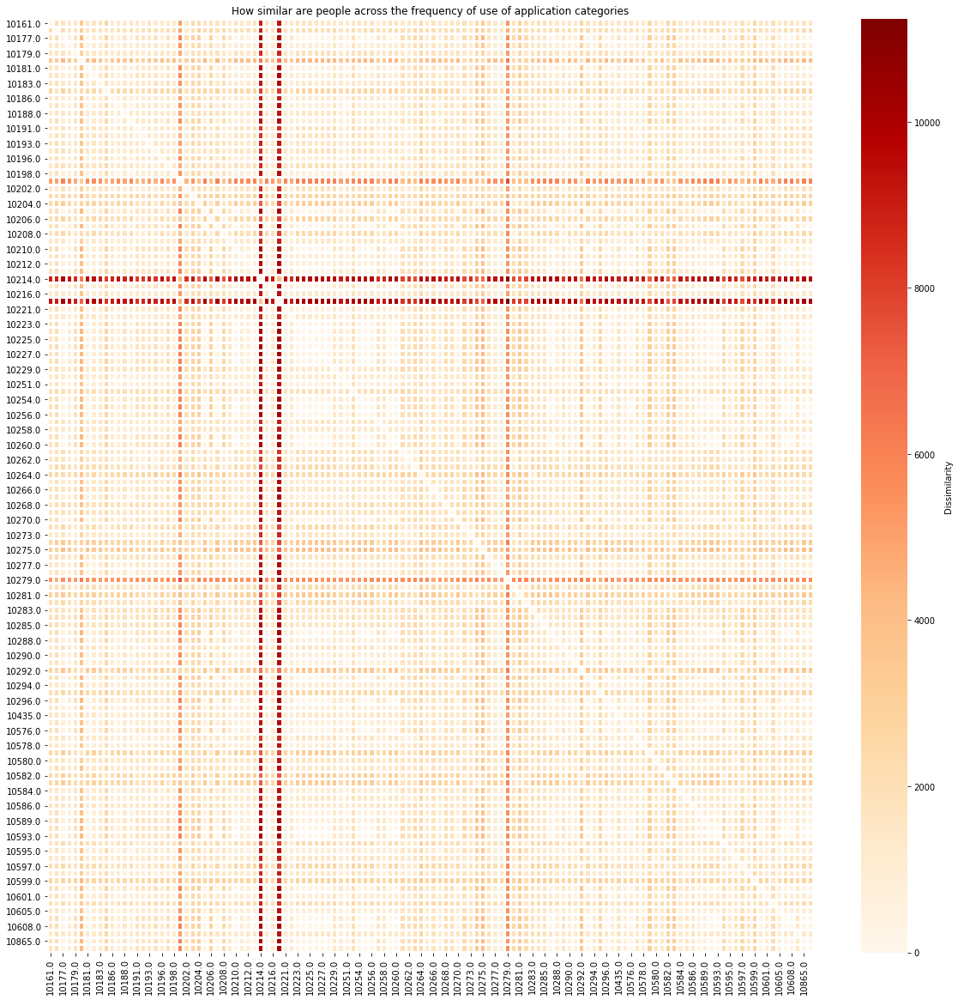

In [39]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_frequency_cats_total,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across the frequency of use of application categories")
plt.show()

# Matrix duration / frequency, time spent on category per use

In [40]:
duration_per_frequency_matrix = np.divide(matrix_duration_total, matrix_freq_total, out=np.zeros_like(matrix_duration_total), where=matrix_freq_total!=0)
matrix_duration_frequency = pd.DataFrame(data=duration_per_frequency_matrix, columns=["user_id",'Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube'])
matrix_duration_frequency["user_id"] = matrix_freq_total["user_id"]

In [41]:
matrix_duration_frequency

,user_id,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube
0,10161.0,6.923935,35.878622,30.798164,0.000000,103.340334,0.000000,0.000000,72.636690,0.000000,41.048571,189.235182,23.849387,0.000000,0.000000,0.000000,41.887985,53.777154,477.611630
1,10176.0,7.996953,26.658538,19.043420,113.212608,17.310000,25.357636,13.918500,44.361431,79.066862,63.883696,0.000000,49.574500,35.092807,0.000000,8.819325,6.422189,25.128073,111.103805
2,10177.0,9.510890,14.105000,46.393931,0.000000,115.226128,117.127000,0.000000,0.000000,0.000000,6.737056,0.000000,11.757588,0.000000,0.000000,0.000000,9.814943,23.059603,0.000000
3,10178.0,8.424543,92.209713,118.668506,67.328930,81.928000,13.289723,13.534000,40.936977,82.375849,12.299000,57.901094,28.010250,43.958333,0.000000,21.068220,16.143357,33.184554,7.755000
4,10179.0,4.449250,76.258923,117.473465,106.239034,13.168100,12.971333,521.947205,0.000000,59.895538,75.873186,0.000000,49.997940,37.915391,0.000000,122.766816,9.849436,58.921581,141.332625
5,10180.0,10.727819,38.691367,35.463474,110.426051,65.668399,24.919844,7.781000,101.871000,66.849890,37.765701,0.000000,49.450263,57.429795,0.000000,0.000000,18.672886,144.588332,246.870498
6,10181.0,2.105714,26.107630,16.014216,103.028352,12.316955,6.907500,0.000000,101.027078,70.176679,18.349947,0.000000,23.029309,64.401618,0.000000,14.645000,7.788968,46.001117,105.732000
7,10182.0,30.077029,17.769235,27.141200,0.000000,0.000000,33.388900,380.936443,34.565774,0.000000,82.602824,0.000000,20.801818,27.530364,0.000000,15.185735,13.811984,27.220003,194.559125
8,10183.0,16.849000,119.073760,38.358674,185.920002,14.187500,39.585235,230.435080,0.000000,151.544767,71.976843,124.449644,50.976477,26.356200,205.611280,17.126980,17.869872,60.944910,114.834636
9,10184.0,15.935429,19.801996,29.014102,81.056805,31.467333,30.426600,92.862968,56.415739,89.265058,63.720482,0.000000,27.383870,31.632474,102.961125,9.801052,15.478671,24.916626,149.661267


In [42]:
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
matrix_duration_frequency[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(matrix_duration_frequency[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_duration_per_frequency = pd.DataFrame(eucl_dist.pairwise(matrix_duration_frequency[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = matrix_duration_frequency.user_id.unique(), index = matrix_duration_frequency.user_id.unique())

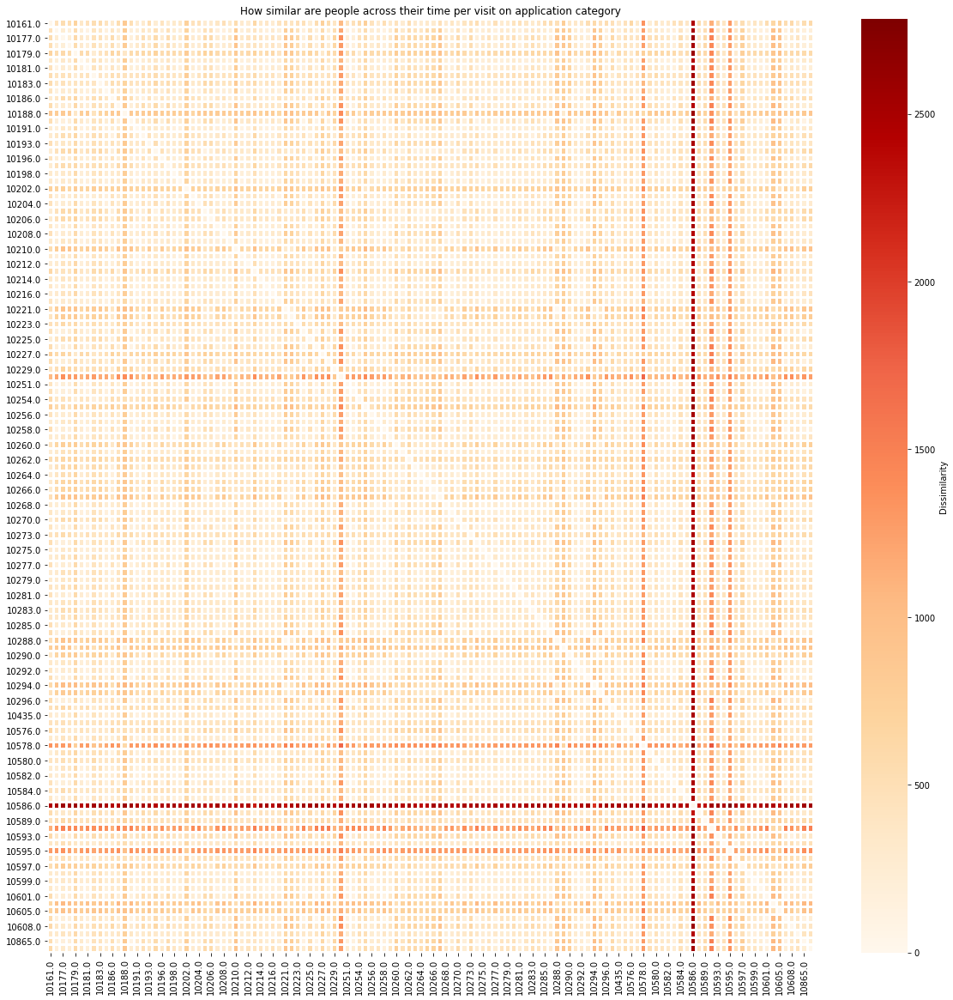

In [68]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_duration_per_frequency,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across their time per visit on application category")
plt.show()

# Baseline models

In [44]:
#BASELINE FOR ALL MOODS
#create random values for all the moods  in a new dataframe with all the user id rows
random.seed(200)
baseline_mood = pd.DataFrame(np.random.randint((0.0),(5.0),size=(8386, 11)), columns=mood_list)
baseline_mood["user_id"] = mood["user_id"]
baseline_mood

,anxious,bored,gloomy,calm,stressed,content,cheerful,tired,energetic,upset,envious,user_id
0,1,0,3,3,2,2,2,2,1,0,0,10161
1,3,4,2,4,2,1,2,0,0,4,0,10161
2,4,1,2,2,4,0,4,4,4,3,0,10161
3,3,1,0,1,2,0,3,2,3,1,3,10161
4,1,1,0,0,1,2,0,2,1,2,1,10161
5,0,0,2,1,2,1,3,1,3,3,0,10176
6,0,0,4,3,0,3,3,3,3,4,3,10176
7,0,0,1,1,0,4,0,2,2,4,0,10176
8,4,2,2,1,4,0,2,4,4,4,0,10176
9,4,3,3,3,0,3,1,4,1,0,4,10176


In [45]:
#create the dataframe with median moods so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the moods combination can be summed over all the registrations of one user and add this as one row to a new dataframe
matrix_mood_baseline = pd.DataFrame()
median_col = 0
participants = np.unique(baseline_mood.user_id)
for userid in participants:
    #print(userid)
    mood_rows_per_participant = baseline_mood[baseline_mood["user_id"] == userid]
    #print( mood_rows_per_participant)
    #the median is used as center size for the mood values summary per participant (try other center sizes as well!)
    median_col = mood_rows_per_participant.median()
    #median_col[0] = int(userid) #proberen er geen float value van te maken
    #print(median_col)
    matrix_mood_baseline = matrix_mood_baseline.append(median_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_mood_baseline.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_baseline_mood = matrix_mood_baseline.reindex(columns= col_names)

In [46]:
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
matrix_baseline_mood[['anxious',
       'bored', 'gloomy', 'calm', 'stressed', 'content', 'cheerful', 'tired',
       'energetic', 'upset', 'envious']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(matrix_baseline_mood[['anxious',
       'bored', 'gloomy', 'calm', 'stressed', 'content', 'cheerful', 'tired',
       'energetic', 'upset', 'envious']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_baseline_mood = pd.DataFrame(eucl_dist.pairwise(matrix_baseline_mood[['anxious',
       'bored', 'gloomy', 'calm', 'stressed', 'content', 'cheerful', 'tired',
       'energetic', 'upset', 'envious']].values), columns = matrix_baseline_mood.user_id.unique(), index = matrix_baseline_mood.user_id.unique())

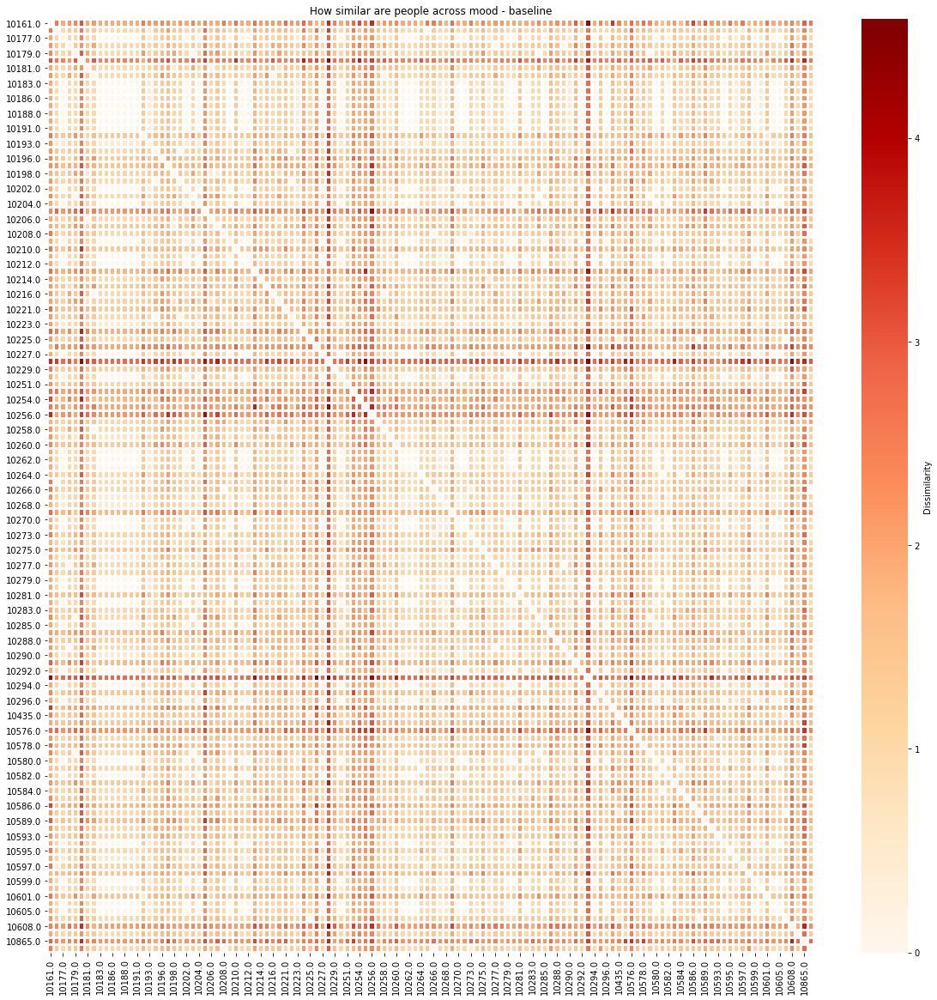

In [47]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_baseline_mood,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across mood - baseline")
plt.show()

In [55]:
#BASELINE FOR TIME PER FREQUENCY (between 0 and 2486.858000 because that is the max number of any cell in the normal frame)
random.seed(3000)
baseline_freq_duration = pd.DataFrame(np.random.randint(0,2486.858000,size=(457182, 18)), columns=categories_list)
baseline_freq_duration["user_id"] = phone_use_cat_cleaned["user_id"]
baseline_freq_duration[457173:]

,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube,user_id
457173,1659,1615,746,329,76,868,183,1382,2386,16,104,1587,2106,2255,225,881,1996,1900,10279
457174,376,1232,1237,542,2235,2189,2269,33,1075,2182,2075,574,1764,694,986,709,2242,1047,10279
457175,2485,1037,1803,440,1803,208,624,1787,78,356,706,1714,756,1592,2029,1654,1336,2069,10279
457176,6,553,186,1247,1719,704,862,415,233,1691,169,1382,47,1147,2021,1343,2408,2014,10279
457177,1489,1102,960,2219,1652,1733,528,1192,1993,30,1084,1644,2146,1040,2372,1190,1018,425,10279
457178,171,1693,2073,865,1398,428,32,289,2313,465,1834,559,1893,168,618,1219,1233,515,10606
457179,2080,864,1210,2196,2052,1815,1830,859,1537,1590,996,641,89,709,2153,1423,374,852,10606
457180,1006,1357,1327,1876,2179,439,1991,1931,2252,2138,1927,805,809,2393,465,1548,2447,274,10606
457181,98,2302,1215,1700,193,2058,483,2156,1829,1318,1485,999,1020,1710,1302,2191,1739,1072,10606


In [56]:
#create the dataframe with total duration of app use so that the RDM can be computed from this dataframe
#cluster rows based on user_id, so all the values of the phone use duration per category can be summed over all the registrations of one user and add this as one row to a new dataframe
matrix_baseline_duration_freq = pd.DataFrame()
total_col = 0
participants = np.unique(baseline_freq_duration.user_id)
for userid in participants:
    #print(userid)
    phone_rows_per_participant = baseline_freq_duration[baseline_freq_duration["user_id"] == userid]
    #print(phone_rows_per_participant)
    #the total is used as (center) size for the duration values per category summary per participant (try other center sizes as well!)
    total_col = (np.sum(phone_rows_per_participant))
    #print(total_col)
    #total_col[0] = int(userid)
    matrix_baseline_duration_freq = matrix_baseline_duration_freq.append(total_col, ignore_index=True)

#take user id back to the first column
col_names = matrix_baseline_duration_freq.columns.tolist()
col_names.insert(0, col_names.pop(col_names.index('user_id')))
matrix_duration_freq_baseline = matrix_baseline_duration_freq.reindex(columns= col_names)

In [57]:
matrix_duration_freq_baseline["user_id"] = matrix_duration_total["user_id"]
matrix_duration_freq_baseline

,user_id,Background_Process,Communication,Entertainment,Facebook,Facebook_Messenger,Finance,Games,Google_Chrome,Instagram,Lifestyle,Online_Shopping,Productivity,Snapchat,Social,Spotify,Utility,Whatsapp_Messenger,Youtube
0,10161.0,5502962.0,5576118.0,5511087.0,5580420.0,5474769.0,5528485.0,5459172.0,5534757.0,5550490.0,5543387.0,5485708.0,5583362.0,5501350.0,5496538.0,5620967.0,5567094.0,5587924.0,5570779.0
1,10176.0,7253768.0,7204395.0,7156043.0,7244066.0,7221023.0,7208850.0,7181274.0,7236491.0,7230209.0,7218170.0,7316862.0,7177834.0,7189070.0,7324588.0,7309415.0,7190533.0,7266808.0,7176523.0
2,10177.0,721187.0,754498.0,724687.0,760217.0,723004.0,738603.0,769256.0,768632.0,748618.0,732381.0,746704.0,771360.0,769170.0,748365.0,753281.0,776086.0,740327.0,731252.0
3,10178.0,3099736.0,3091245.0,3094416.0,3104472.0,3113580.0,3119036.0,3112139.0,3106281.0,3072365.0,3156711.0,3080468.0,3096354.0,3141466.0,3144359.0,3130251.0,3142958.0,3171034.0,3121708.0
4,10179.0,7341596.0,7302889.0,7259910.0,7274283.0,7261045.0,7245361.0,7353466.0,7238200.0,7234212.0,7265543.0,7361234.0,7248910.0,7358645.0,7190018.0,7180562.0,7296290.0,7268031.0,7265944.0
5,10180.0,11275979.0,11286273.0,11314362.0,11188935.0,11269519.0,11281441.0,11327495.0,11303333.0,11312235.0,11312420.0,11334985.0,11341976.0,11316369.0,11256052.0,11288215.0,11308140.0,11390443.0,11377444.0
6,10181.0,1684659.0,1617196.0,1597092.0,1657845.0,1613363.0,1621489.0,1642330.0,1610829.0,1621562.0,1645340.0,1672292.0,1615565.0,1621567.0,1635869.0,1647240.0,1655835.0,1634758.0,1635596.0
7,10182.0,2786331.0,2789183.0,2822279.0,2829098.0,2801159.0,2822442.0,2776096.0,2839497.0,2805520.0,2858297.0,2800105.0,2836481.0,2814276.0,2831632.0,2817099.0,2827906.0,2869706.0,2777012.0
8,10183.0,4617076.0,4482961.0,4459855.0,4493916.0,4539945.0,4485483.0,4520884.0,4551328.0,4550783.0,4542448.0,4546587.0,4540458.0,4528442.0,4551907.0,4457841.0,4572659.0,4532923.0,4619517.0
9,10184.0,10149758.0,10022460.0,9946555.0,10084896.0,9999893.0,10008908.0,10090964.0,9929227.0,10048569.0,10002409.0,9986757.0,10101648.0,10200685.0,10092843.0,10036818.0,10090116.0,9937581.0,10018348.0


In [58]:
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
matrix_duration_freq_baseline[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(matrix_duration_freq_baseline[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_baseline_duration_freq = pd.DataFrame(eucl_dist.pairwise(matrix_duration_freq_baseline[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = matrix_duration_freq_baseline.user_id.unique(), index = matrix_duration_freq_baseline.user_id.unique())

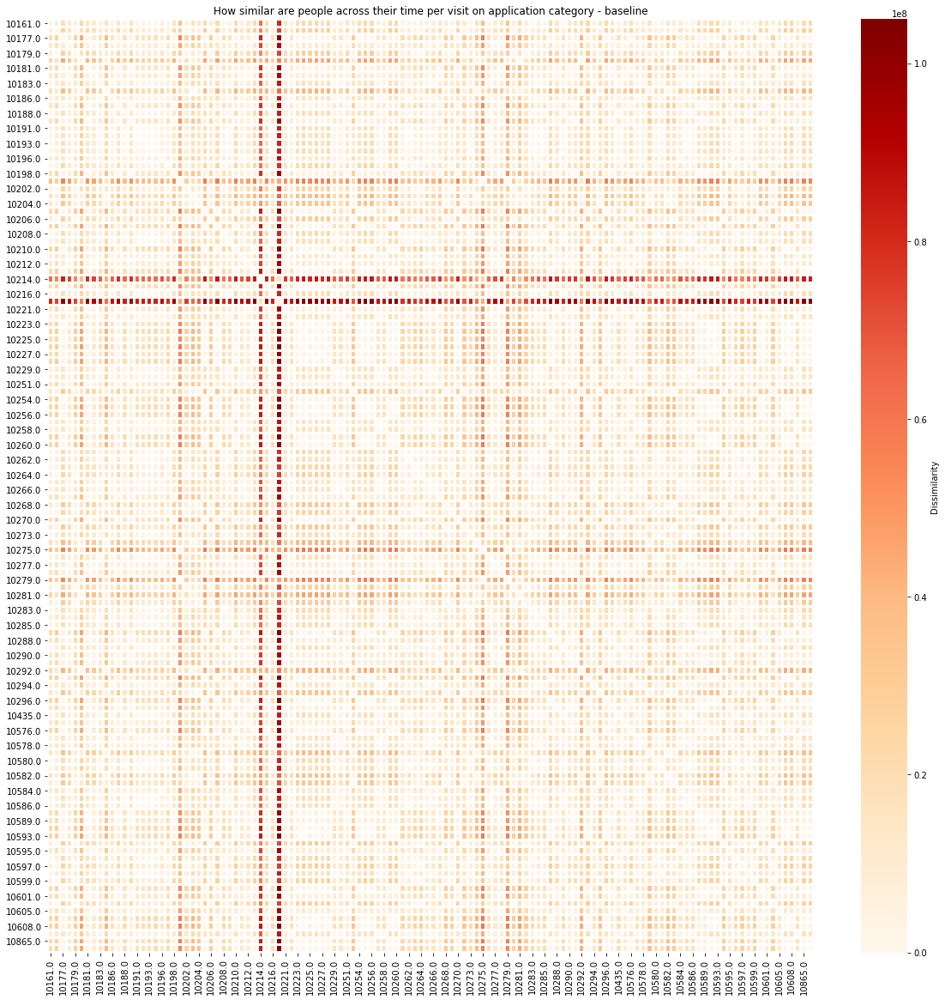

In [67]:
plt.figure(figsize=(20,20))
ax = plt.axes()
sns.heatmap(
    RDM_baseline_duration_freq,
    cmap='OrRd',
    linewidth=2,
    cbar_kws = {"label": "Dissimilarity"},
    ax = ax

)
ax.set_title("How similar are people across their time per visit on application category - baseline")
plt.show()

# Evaluation - Compare RDM's with Spearman rank correlation

In [60]:
#compute the upper triangle of matrix for comparison between RDM's
#https://cmdlinetips.com/2019/08/how-to-compute-pearson-and-spearman-correlation-in-python/
array_phoneuse_duration = np.array(RDM_duration_cats_total)
array_freq = np.array(RDM_frequency_cats_total)
array_duration_per_freq = np.array(RDM_duration_per_frequency)
array_mood_corr_distance = np.array(RDM_mood_correlation_distance)
array_pos_corr_dist = np.array(RDM_pos_corr_dist_fill)
array_neg_corr_dist = np.array(RDM_neg_corr_dist_fill)


triangle_phoneuse_duration = upper_tri_indexing(array_phoneuse_duration)
triangle_freq = upper_tri_indexing(array_freq)
triangle_duration_freq = upper_tri_indexing(array_duration_per_freq)
triangle_duration_freq = upper_tri_indexing(array_duration_per_freq)
triangle_mood_corr_dist = upper_tri_indexing(array_mood_corr_distance)
triangle_pos_corr_dist = upper_tri_indexing(array_pos_corr_dist)
triangle_neg_corr_dist = upper_tri_indexing(array_neg_corr_dist)



#baseline
array_baseline_durfreq = np.array(RDM_baseline_duration_freq)
array_baseline_mood = np.array(RDM_baseline_mood)
#baseline
triangle_baseline_durfreq = upper_tri_indexing(array_baseline_durfreq)
triangle_baseline_mood = upper_tri_indexing(array_baseline_mood)



#convert arrays into lists 
list_duration = list(triangle_phoneuse_duration)
list_freq = list(triangle_freq)
list_duration_freq = list(triangle_duration_freq)
list_mood_corr_dist = list(triangle_mood_corr_dist)
list_pos_corr_dist = list(triangle_pos_corr_dist)
list_neg_corr_dist = list(triangle_neg_corr_dist)


#baseline
list_baseline_durfreq = list(triangle_baseline_durfreq)
list_baseline_mood = list(triangle_baseline_mood)

#create dataframe with the lists of the data
spearman_frame = pd.DataFrame({"mood_corr_dist": list_mood_corr_dist})
spearman_frame["duration"] = list_duration
spearman_frame["frequency"] = list_freq
spearman_frame["duration_per_frequency"] = list_duration_freq
spearman_frame["neg_corr_dist"] = list_neg_corr_dist
spearman_frame["pos_corr_dist"] = list_pos_corr_dist

#baseline
spearman_frame["baseline_duration_freq"] = list_baseline_durfreq
spearman_frame["baseline_mood"] = list_baseline_mood

spearman_frame

,mood_corr_dist,duration,frequency,duration_per_frequency,neg_corr_dist,pos_corr_dist,baseline_duration_freq,baseline_mood
0,8.248462e-01,344958.314425,2220.847811,450.599028,1.547723e+00,8.675468e-01,7.177759e+06,2.598076
1,6.568948e-01,330917.149235,1611.572524,535.797227,0.000000e+00,6.666667e-01,2.031785e+07,1.936492
2,8.078945e-01,330429.131580,1343.726535,516.100323,1.283069e+00,0.000000e+00,1.027309e+07,2.179449
3,1.317783e+00,365167.232608,1545.651643,691.650196,1.311086e+00,1.835034e-01,7.378820e+06,2.397916
4,9.789462e-01,534192.561368,3471.442207,348.516466,1.166667e+00,0.000000e+00,2.446961e+07,3.122499
5,9.499387e-01,329515.713675,1425.887794,453.013698,1.509525e+00,6.348516e-01,1.655823e+07,1.936492
6,5.311097e-01,319375.223045,1548.278076,528.564272,6.464466e-01,6.666667e-01,1.154400e+07,2.179449
7,7.260222e-01,382433.321016,1676.187042,560.258667,1.166667e+00,8.259223e-01,4.271310e+06,1.936492
8,5.284337e-01,373648.358627,2648.609446,432.406536,4.904753e-01,1.000000e+00,1.911282e+07,1.936492
9,7.935741e-01,224512.794028,1218.000821,288.648359,1.000000e+00,1.132453e+00,4.860412e+06,1.936492


In [61]:
print("spearman correlation for total mood (with CORRELATION DISTANCE) with duration PER frequency")
print(spearman_frame.mood_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
print()
print("spearman correlation for duration and frequency with TOTAL mood (with CORRELATION DISTANCE)")
print(spearman_frame.mood_corr_dist.corr(spearman_frame.duration, method ="spearman"))
print(spearman_frame.mood_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
print()
print("spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with duration PER frequency")
print(spearman_frame.pos_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
print(spearman_frame.neg_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
print()
print("spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with duration")
print(spearman_frame.pos_corr_dist.corr(spearman_frame.duration, method ="spearman"))
print(spearman_frame.neg_corr_dist.corr(spearman_frame.duration, method ="spearman"))
print()
print("spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with frequency")
print(spearman_frame.pos_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
print(spearman_frame.neg_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
print()
print("spearman correlations for duration with frequency")
print(spearman_frame.frequency.corr(spearman_frame.duration, method ="spearman"))
print("spearman correlations for positive mood with negative mood")
print(spearman_frame.neg_corr_dist.corr(spearman_frame.pos_corr_dist, method ="spearman"))


spearman correlation for total mood (with CORRELATION DISTANCE) with duration PER frequency
-0.025835062789831196

spearman correlation for duration and frequency with TOTAL mood (with CORRELATION DISTANCE)
0.19877695046212168
0.12345335471618873

spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with duration PER frequency
0.02306507468927067
-0.1169577212548192

spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with duration
-0.05742083256535153
0.13569342339525625

spearman correlations for positive and negative moods (with CORRELATION DISTANCE) with frequency
0.019248434582666396
0.15240410714248764

spearman correlations for duration with frequency
0.5088273459629921
spearman correlations for positive mood with negative mood
0.04176019272500199


In [62]:
print("spearman correlation for total mood BASELINE with duration PER frequency BASELINE")
print(spearman_frame.baseline_duration_freq.corr(spearman_frame.baseline_mood, method ="spearman"))

spearman correlation for total mood BASELINE with duration PER frequency BASELINE
0.068066533855944


# Check for significance of correlation

In [89]:
#compute correlation all moods - duration
corr_mood_duration = (spearman_frame.mood_corr_dist.corr(spearman_frame.duration, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.mood_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_mood_duration)))/p
p_val

0.0005

In [90]:
#compute correlation negative moods - duration
corr_neg_duration = (spearman_frame.neg_corr_dist.corr(spearman_frame.duration, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.neg_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_neg_duration)))/p
p_val

0.0005

In [91]:
#compute correlation positive moods - duration
corr_pos_duration = (spearman_frame.pos_corr_dist.corr(spearman_frame.duration, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.pos_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_pos_duration)))/p
p_val

0.0005

In [63]:
#compute correlation all moods - time per use 
corr_mood_durfreq = (spearman_frame.mood_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.mood_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration_per_frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_mood_durfreq)))/p
p_val

0.0005

In [64]:
#compute correlation negative moods - time per use 
corr_negmood_durfreq = (spearman_frame.neg_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.neg_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration_per_frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_negmood_durfreq)))/p
p_val


0.0005

In [65]:
#compute correlation positive moods - time per use 
corr_posmood_durfreq = (spearman_frame.pos_corr_dist.corr(spearman_frame.duration_per_frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.pos_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.duration_per_frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_posmood_durfreq)))/p
p_val


0.0005

In [66]:
#compute correlation all moods - frequency
corr_allmood_frequency = (spearman_frame.mood_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.mood_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_allmood_frequency)))/p
p_val

KeyboardInterrupt: 

In [ ]:
#compute correlation negative moods - frequency
corr_negmood_frequency = (spearman_frame.neg_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.neg_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_negmood_frequency)))/p
p_val

In [ ]:
#compute correlation positive moods - frequency
corr_posmood_frequency = (spearman_frame.pos_corr_dist.corr(spearman_frame.frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.mood_corr_dist)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_posmood_frequency)))/p
p_val

In [ ]:
#compute correlation duration - frequency
corr_duration_frequency = (spearman_frame.duration.corr(spearman_frame.frequency, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.duration)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.frequency, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_duration_frequency)))/p
p_val

In [ ]:
#compute correlation baseline mood - baseline phone use
corr_baselines = (spearman_frame.baseline_duration_freq.corr(spearman_frame.baseline_mood, method ="spearman"))
#Copy one of the features:
pS = copy.copy(spearman_frame.baseline_duration_freq)
#Initialize variables:
pR = []
#Choose number of permutations:
p=2000
#Initialize permutation loop:
for i in range(0,p):
  #Shuffle one of the features:
    random.shuffle(pS)
    #Computed permuted correlations and store them in pR:
    pR.append(pS.corr(spearman_frame.baseline_mood, method ="spearman"))

#Significance:
p_val = len(np.where(np.abs(pR)>=np.abs(corr_baselines)))/p
p_val

# Cross validation to check for stability/consistency of data

In [187]:
#for all moods
#first shuffle the data in the dataframe and split it in 3 parts (folds)
shuffled_mood = matrix_allmood_median.sample(frac=1)
result_mood = np.array_split(shuffled_mood, 3)
fold1_mood = result_mood[0]
fold2_mood = result_mood[1]
fold3_mood = result_mood[2]

#create the matrix with pearson correlation!
RDM_fold1_mood = pd.DataFrame(
    squareform(pdist(fold1_mood, metric='correlation')),
    columns = fold1_mood.index,
    index = fold1_mood.index
)
RDM_fold1_mood_fill = RDM_fold1_mood.fillna(0)

RDM_fold2_mood = pd.DataFrame(
    squareform(pdist(fold2_mood, metric='correlation')),
    columns = fold2_mood.index,
    index = fold2_mood.index
)
RDM_fold2_mood_fill = RDM_fold2_mood.fillna(0)

RDM_fold3_mood = pd.DataFrame(
    squareform(pdist(fold3_mood, metric='correlation')),
    columns = fold3_mood.index,
    index = fold3_mood.index
)
RDM_fold3_mood_fill = RDM_fold3_mood.fillna(0)

In [188]:
#for duration per use (dur/freq)
#first shuffle the data in the dataframe and split it in 3 parts (folds)
shuffled_duration_freq = matrix_duration_frequency.sample(frac=1)
result_duration_freq = np.array_split(shuffled_duration_freq, 3)
fold1_duration_freq = result_duration_freq[0]
fold2_duration_freq = result_duration_freq[1]
fold3_duration_freq = result_duration_freq[2]
#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
fold1_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(fold1_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_fold1_duration_freq = pd.DataFrame(eucl_dist.pairwise(fold1_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = fold1_duration_freq.user_id.unique(), index = fold1_duration_freq.user_id.unique())

#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
fold2_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(fold2_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_fold2_duration_freq = pd.DataFrame(eucl_dist.pairwise(fold2_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = fold2_duration_freq.user_id.unique(), index = fold2_duration_freq.user_id.unique())

#create the matrix!
#set which distance metric is used 
eucl_dist = DistanceMetric.get_metric('euclidean')
#create a 11d matrix
fold3_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values
#ensure that the euclidean distance is calculated pairwise in the 11d matrix
eucl_dist.pairwise(fold3_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values)
#create the RDM for mean with euclidean distance and center size mean
RDM_fold3_duration_freq = pd.DataFrame(eucl_dist.pairwise(fold3_duration_freq[['Background_Process', 'Communication' ,'Entertainment', 'Facebook',
 'Facebook_Messenger' ,'Finance', 'Games' ,'Google_Chrome', 'Instagram',
 'Lifestyle' ,'Online_Shopping', 'Productivity', 'Snapchat' ,'Social',
 'Spotify' ,'Utility' ,'Whatsapp_Messenger' ,'Youtube']].values), columns = fold3_duration_freq.user_id.unique(), index = fold3_duration_freq.user_id.unique())

In [189]:
#prepare folds for spearman correlation and compute spearman correlation
#check for the folds comparison
array_fold1_mood = np.array(RDM_fold1_mood_fill)
array_fold2_mood = np.array(RDM_fold2_mood_fill)
array_fold3_mood = np.array(RDM_fold3_mood_fill)
array_fold1_duration_freq = np.array(RDM_fold1_duration_freq)
array_fold2_duration_freq = np.array(RDM_fold2_duration_freq)
array_fold3_duration_freq = np.array(RDM_fold3_duration_freq)



triangle_fold1_mood = upper_tri_indexing(array_fold1_mood)
triangle_fold2_mood = upper_tri_indexing(array_fold2_mood)
triangle_fold3_mood = upper_tri_indexing(array_fold3_mood)
triangle_fold1_duration_freq = upper_tri_indexing(array_fold1_duration_freq)
triangle_fold2_duration_freq = upper_tri_indexing(array_fold2_duration_freq)
triangle_fold3_duration_freq = upper_tri_indexing(array_fold3_duration_freq)




#convert fold arrays
list_fold1_mood = list(triangle_fold1_mood)
list_fold2_mood = list(triangle_fold2_mood)
list_fold3_mood = list(triangle_fold3_mood)
list_fold1_duration_freq = list(triangle_fold1_duration_freq)
list_fold2_duration_freq = list(triangle_fold2_duration_freq)
list_fold3_duration_freq = list(triangle_fold3_duration_freq)

#print(len(list_fold1_mood))
#print(len(list_fold2_mood))
#print(len(list_fold3_mood))
#print(len(list_fold1_duration))
#print(len(list_fold2_duration))
#print(len(list_fold3_duration))

mood12 = list_fold1_mood + list_fold2_mood
mood23 = list_fold2_mood + list_fold3_mood
mood13 = list_fold1_mood + list_fold3_mood
durationfreq12 = list_fold1_duration_freq + list_fold2_duration_freq
durationfreq23 = list_fold2_duration_freq + list_fold3_duration_freq
durationfreq13 = list_fold3_duration_freq + list_fold1_duration_freq


#print(len(mood23))
#print(len(duration23))
spearman_fold_frame = pd.DataFrame({"fold1_and_2_mood" : mood12})
spearman_fold_frame["fold1_and_3_mood"] = mood13

spearman_fold_frame["fold1_and_2_durationfreq"] = durationfreq12
spearman_fold_frame["fold1_and_3_durationfreq"] = durationfreq13

spearman_fold_frame_second = pd.DataFrame({"fold2_and_3_mood" : mood23})
spearman_fold_frame_second["fold2_and_3_durationfreq"] = durationfreq23

In [190]:
#check correlation for fold frames --> correlation for all moods and duration per usage = -0.025835062789831196
print("fold correlations for total mood with duration per usage")
print(spearman_fold_frame.fold1_and_2_mood.corr(spearman_fold_frame.fold1_and_2_durationfreq, method ="spearman"))
print(spearman_fold_frame.fold1_and_3_mood.corr(spearman_fold_frame.fold1_and_3_durationfreq, method ="spearman"))
print(spearman_fold_frame_second.fold2_and_3_mood.corr(spearman_fold_frame_second.fold2_and_3_durationfreq, method ="spearman"))

#correlation for all moods and duration = 0.1988
print("fold correlations for total mood with duration")
print(spearman_fold_frame.fold1_and_2_mood.corr(spearman_fold_frame.fold1_and_2_duration, method ="spearman"))
print(spearman_fold_frame.fold1_and_3_mood.corr(spearman_fold_frame.fold1_and_3_duration, method ="spearman"))
print(spearman_fold_frame_second.fold2_and_3_mood.corr(spearman_fold_frame_second.fold2_and_3_duration, method ="spearman"))


fold correlations for total mood with duration per usage
-0.05951640736014335
-0.0019574709982682985
-0.049888580234579157
fold correlations for total mood with duration
-0.04907871799719626
0.04771541597676657
-0.062139599409848825
fold correlations for frequency with duration
0.08562156024931221
0.1048350039373046
0.030224049258059153


# Plots

Text(0, 0.5, 'duration application use')

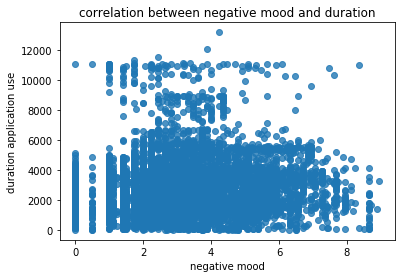

In [68]:
plt.scatter(spearman_frame.negative, spearman_frame.duration, alpha = 0.8)
plt.title("correlation between negative mood and duration")
plt.xlabel("negative mood")
plt.ylabel("duration application use")

Text(0, 0.5, 'duration application use')

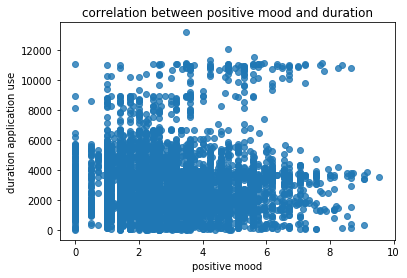

In [69]:
plt.scatter(spearman_frame.positive, spearman_frame.duration, alpha = 0.8)
plt.title("correlation between positive mood and duration")
plt.xlabel("positive mood")
plt.ylabel("duration application use")

Text(0, 0.5, 'duration application use')

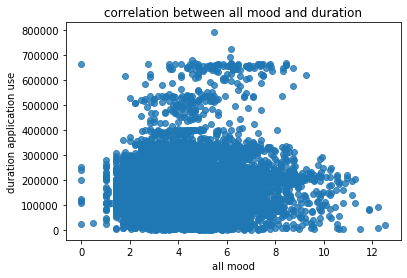

In [82]:
plt.scatter(spearman_frame.medianmood
, spearman_frame.duration, alpha = 0.8)
plt.title("correlation between all mood and duration")
plt.xlabel("all mood")
plt.ylabel("duration application use")

Text(0, 0.5, 'duration per frequency application use')

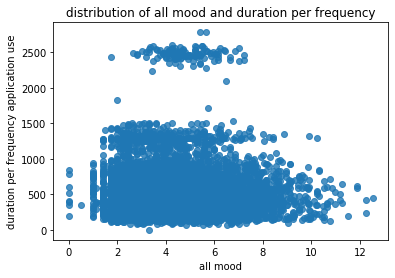

In [82]:
plt.scatter(spearman_frame.medianmood
, spearman_frame.duration_per_frequency, alpha = 0.8)
plt.title("distribution of all mood and duration per frequency")
plt.xlabel("all mood")
plt.ylabel("duration per frequency application use")

Text(0, 0.5, 'duration per frequency application use')

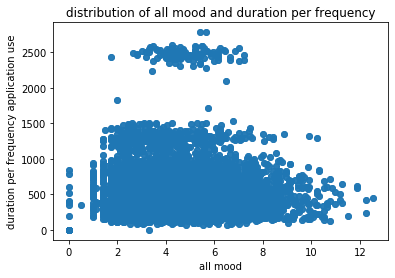

In [81]:
plt.scatter(RDM_mood_bymedian
, RDM_duration_per_frequency, alpha = 0.8)
plt.title("distribution of all mood and duration per frequency")
plt.xlabel("all mood")
plt.ylabel("duration per frequency application use")

